# CAMS50 VRA2016: Model performance
CAMS50 runs a reanalysis with validated obrvations 2 years after the fact.

numpy 1.14.1
pandas 0.22.0
xarray 0.10.1
holoviews 1.9.5-x-g39fe834be



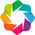

In [1]:
import numpy as np
import pandas as pd
import xarray as xr
import holoviews as hv
import geoviews as gv

for m in [np, pd, xr, hv]:
    print("%s %s"%(m.__name__, m.__version__))

# only 3 decimal points on df.head() and df.describe()
pd.options.display.float_format = '{:,.0f}'.format

tiles = 'https://maps.wikimedia.org/osm-intl/{Z}/{X}/{Y}@2x.png'
hv.notebook_extension('bokeh')

## Datasets
- `eeaVRA`: validated surface obs for data assimilation
- `eeaVAL`: validated surface obs for model evaluataion
- `cifsBC`: CIFS boundary conditions
- `emepHC`: hindcast run (no DA), operational version (CAMS50.201801)
- `emepSS`: hindcast run (no DA), operational version (CAMS50.201801)
- `emepEM`: hindcast run (no DA), operational version (CAMS50.201801), new TNO-CAMS 2015 emissions
- `emepAN`: (re)analysis run (DA: NO2,O3,SO2), operational version (CAMS50.201801; DA16)
- `emepCO`: (re)analysis run (DA: NO2,O3,SO2,CO), operational version (CAMS50.201801; DA16) low rejection threshold (350 ug/m3)
- `emepCOv2`: (re)analysis run (DA: NO2,O3,SO2,CO), operational version (CAMS50.201801; DA16) higher rejection threshold (700 ug/m3)
- `emepPM`: (re)analysis run (DA: NO2,O3,SO2,PM25,PM10), development version (CAMS50.201801; DA17 wo/PM feedback)

In [2]:
lustre = "/lustre/storeA/users/alvarov/CAMS50/%s"
data = xr.open_dataset(lustre%'vra2016colloc.nc')

poll = 'O3 CO NO2 SO2 PM25 PM10'.split()
obs='eeaVAL eeaVRA'.split()
model="""
cifsBC
emepHC emepEM emepSS
emepAN emepCO emepCOv2 emepPM
""".strip().split()
model=[m for m in model if m in data.dataset.values]
model

['cifsBC',
 'emepHC',
 'emepEM',
 'emepSS',
 'emepAN',
 'emepCO',
 'emepCOv2',
 'emepPM']

In [3]:
%time df = data[poll].to_dataframe()
#df.head()

%time df = df.unstack('dataset')
#df.iloc[:, df.columns.get_level_values(0)=='O3'].head()

CPU times: user 6.54 s, sys: 7.21 s, total: 13.7 s
Wall time: 15.8 s
CPU times: user 1min 52s, sys: 50.2 s, total: 2min 42s
Wall time: 2min 42s


## Peformance
### All datapoints
Bias, RMSE and correlation are presented as percentages,
relative to the observations.
Bias is relative to the observatin mean,
and RMSE to the observatin standard deviation.
Correlation is the Pearson coefficient.

In [4]:
%%time

indicators = ['bias', 'rmse', 'corr']
get_stats = lambda m, o: dict(
    bias = (m - o).abs().mean()/o.mean()*100,
    rmse = np.sqrt(((m - o) ** 2).mean())/o.std()*100,
    corr = m.corr(o)*100,
)

stat = pd.DataFrame.from_dict({
    (p, o, m): get_stats(df[(p, m)], df[(p, o)])
    for o in obs for m in model for p in poll
}, orient='index')
#stat.loc['O3','eeaVAL',:].head()

stat = stat.reindex(
    pd.MultiIndex(
        levels=[poll, obs, model],
        labels=stat.index.labels,
        names=['poll', 'obs', 'model']
    )
)
# stat.head()

CPU times: user 3min 21s, sys: 13.3 s, total: 3min 35s
Wall time: 3min 35s


In [5]:
%%opts Bars [width=450 height=300 tools=['hover'] xrotation=90 show_legend=False]
%%opts Bars (color=Cycle('Category10'))

hv.Dataset(
   pd.melt(
       stat.reset_index(),
       id_vars=stat.index.names,
       var_name='stat',
       value_vars=indicators,
       value_name='percent',
   ),
   vdims=('percent','%'),
).to(hv.Bars, ['stat', 'model'])

:HoloMap   [poll,obs]
   :Bars   [stat,model]   (percent)

In [6]:
%%opts Bars [width=450 height=300 xrotation=90 show_legend=False]
%%opts Bars (color=Cycle('Category10'))

ds = hv.Dataset(
    stat.reset_index(),
    stat.index.names,
    [(s,'%s %%'%s) for s in indicators],
)

hv.Layout(
    [ds.to(hv.Bars, ['poll','model'], s) for s in indicators]
).cols(1)

:Layout
   .HoloMap.I   :HoloMap   [obs]
      :Bars   [poll,model]   (bias)
   .HoloMap.II  :HoloMap   [obs]
      :Bars   [poll,model]   (rmse)
   .HoloMap.III :HoloMap   [obs]
      :Bars   [poll,model]   (corr)

### By station

In [7]:
%%time 
dd = {(p,m,o): df[p].groupby('station').apply(
        lambda x: get_stats(x[m], x[o])
    ) for o in obs for m in model for p in poll
}

/modules/xenial/user-apps/aerocom/anaconda3-testing/envs/geoviews/lib/python3.6/site-packages/ipykernel_launcher.py:5: RuntimeWarning: divide by zero encountered in double_scalars
  """


CPU times: user 17min 13s, sys: 7min 8s, total: 24min 22s
Wall time: 24min 20s


In [8]:
stat = pd.DataFrame.from_dict({
    k+(s,):v.apply(lambda x:x[s])
    for k,v in dd.items() for s in indicators
}).unstack()
stat.index.names = ['poll', 'model', 'obs', 'stat', 'station']
stat = stat.dropna().unstack('stat')
stat.head()

stat                        bias  corr  rmse
poll model  obs    station                  
CO   cifsBC eeaVAL AL0204A    67    27   169
                   AT0VOR1    64    26   359
                   AT10001    37    65    77
                   AT60172    45    65    94
                   BA0041A    70    38   113

In [9]:
coord = data[['lon','lat']]
coord = coord.sel(dataset='eeaVRA').combine_first(coord.sel(dataset='eeaVAL'))
coord = coord.to_dataframe()
coord.head()

,lon,lat
station,,
AD0942A,2,43
AD0944A,2,43
AD0945A,2,43
AL0203A,21,41
AL0204A,19,40


In [10]:
%%opts Overlay [width=550 height=350]
%%opts Points  (cmap='coolwarm' size=1) [tools=['hover']]
%%opts Points.bias [color_index='bias' size_index='bias']
%%opts Points.rmse [color_index='rmse' size_index='rmse']
%%opts Points.corr [color_index='corr' size_index='corr']

ds = hv.Dataset(
   stat.join(coord).reset_index(),
   vdims=['station']+[(s,'%s %%'%s) for s in indicators],
)

hv.Layout([
    gv.WMTS(tiles)*ds.to(gv.Points, ['lon','lat'], group=s)
    for s in ['rmse', 'corr']
]).cols(1)

:Layout
   .Rmse.I :HoloMap   [poll,model,obs]
      :Overlay
         .WMTS.I :WMTS   [Longitude,Latitude]
         .Rmse.I :Points   [lon,lat]   (station,bias,rmse,corr)
   .Corr.I :HoloMap   [poll,model,obs]
      :Overlay
         .WMTS.I :WMTS   [Longitude,Latitude]
         .Corr.I :Points   [lon,lat]   (station,bias,rmse,corr)

### By month

In [11]:
%%time 
dd = {(p,m,o): df[p].groupby(pd.Grouper(freq='M', level='time')).apply(
        lambda x: get_stats(x[m], x[o])
    ) for o in obs for m in model for p in poll
}

CPU times: user 22min 35s, sys: 1h 13min 57s, total: 1h 36min 33s
Wall time: 1h 36min 24s


In [12]:
stat = pd.DataFrame.from_dict({
    k+(s,):v.apply(lambda x:x[s])
    for k,v in dd.items() for s in indicators
}).unstack()

#stat.index.names = ['poll', 'model', 'obs', 'stat', 'time']
stat = stat.reindex(
    pd.MultiIndex(
        levels=[poll, model, obs, indicators, stat.loc['O3','emepHC','eeaVAL','bias'].index],
        labels=stat.index.labels,
        names=['poll', 'model', 'obs', 'stat', 'time']
    )
)

stat = stat.dropna().unstack('stat')
stat.head()

stat                           bias  rmse  corr
poll model  obs    time                        
O3   cifsBC eeaVAL 2016-01-31    43    88    59
                   2016-02-29    34    88    60
                   2016-03-31    32    93    55
                   2016-04-30    29    93    54
                   2016-05-31    29    90    51

In [13]:
%%opts Bars [width=450 height=300 xrotation=90 show_legend=False]
%%opts Bars (color=Cycle('Category10'))

ds = hv.Dataset(
   stat.reset_index(),
   vdims=[(s,'%s %%'%s) for s in indicators],
)

hv.Layout(
    [ds.to(hv.Bars, ['poll','model'], s) for s in indicators]
).cols(1)

:Layout
   .HoloMap.I   :HoloMap   [obs,time]
      :Bars   [poll,model]   (bias)
   .HoloMap.II  :HoloMap   [obs,time]
      :Bars   [poll,model]   (rmse)
   .HoloMap.III :HoloMap   [obs,time]
      :Bars   [poll,model]   (corr)